<a href="https://colab.research.google.com/github/ad5454/SIP/blob/main/Dog_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Step 1: Import Datasets

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pwd

/content


In [4]:
import zipfile

zip_ref = zipfile.ZipFile("/content/drive/MyDrive/dogImages.zip", "r")
zip_ref.extractall()
zip_ref.close()

In [5]:
import zipfile

zip_ref = zipfile.ZipFile("/content/drive/MyDrive/lfw.zip", "r")
zip_ref.extractall()
zip_ref.close()

In [6]:
from sklearn.datasets import load_files
from keras.utils import np_utils
import numpy as np
from glob import glob

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('dogImages/train')
valid_files, valid_targets = load_dataset('dogImages/valid')
test_files, test_targets = load_dataset('dogImages/test')

# load list of dog names
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]

# print statistics about the dataset
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


In [7]:
import numpy as np
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))

There are 13233 total human images.


In [8]:
### Exploration support functions

import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelEncoder

def print_image(img):
    '''
    This function prints an image from a file

    input: image file path

    output: prints image
    '''

    img = cv2.imread(img)
    cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(cv_rgb)
    plt.show()
    return

def image_info(df_image, label):
    '''
    returns the shape of image, image itself and the rgbm intensity distribution of an image

    input: - image
           - label for image

    output: - image shape
            - image itself
            - rgb intensity distribution
    '''
    img = cv2.imread(df_image)
    color = ('b','g','r')
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        plt.plot(histr,color = col)
        plt.xlim([0,256])

    print(dog_names[np.argmax(label)])
    print(img.shape)
    plt.show()
    #plt.imshow(img)
    print_image(df_image)

    return

def dist_breed(labels):
    '''
    This function plots the distribution of the dog breeds in the training data

    Input
    '''
    encoder = LabelEncoder()
    breeds_encoded = encoder.fit_transform(labels)
    classes_n = len(encoder.classes_)

    breeds = pd.DataFrame(np.array(breeds_encoded), columns=["breed"]).reset_index(drop=True)
    breeds['freq'] = breeds.groupby('breed')['breed'].transform('count')
    avg = breeds.freq.mean()

    title = 'Distribution of Dog Breeds in training Dataset'
    f, ax = plt.subplots(1, 1, figsize=(10, 6))
    ax.set_xticks([])

    ax.hlines(avg, 0, classes_n - 1, color='firebrick')
    ax.set_title(title, fontsize=18)
    _ = ax.hist(breeds_encoded, bins=classes_n)

    print("There are {:.1f} sample images per dog breed on average".format(avg))

    return(breeds["freq"].describe())

def duplicates(lst, item):
    '''
    This function takes a list of labels (dogbreeds) and a label (dog breed) of interest
    and determinesthe shows the indexes of the images representing the same label

    input: - list of labels: e.g. labels of training data set.  this list  continas duplicates.
           - label of interest e.g. dog breed of interest for further analyses

    output: - list of indexes from thelist of labels that represents the label of interest
    '''
    return [i for i, x in enumerate(lst) if x == item]

## get the list of labels and save them as a list
labels_train = []
labels_test = []

for i in range(train_files.shape[0]):
    labels_train.append(dog_names[np.argmax(train_targets[i])])

for i in range(test_files.shape[0]):
    labels_test.append(dog_names[np.argmax(test_targets[i])])

There are 53.0 sample images per dog breed on average


count    6680.000000
mean       53.006886
std        11.377801
min        26.000000
25%        46.000000
50%        53.000000
75%        63.000000
max        77.000000
Name: freq, dtype: float64

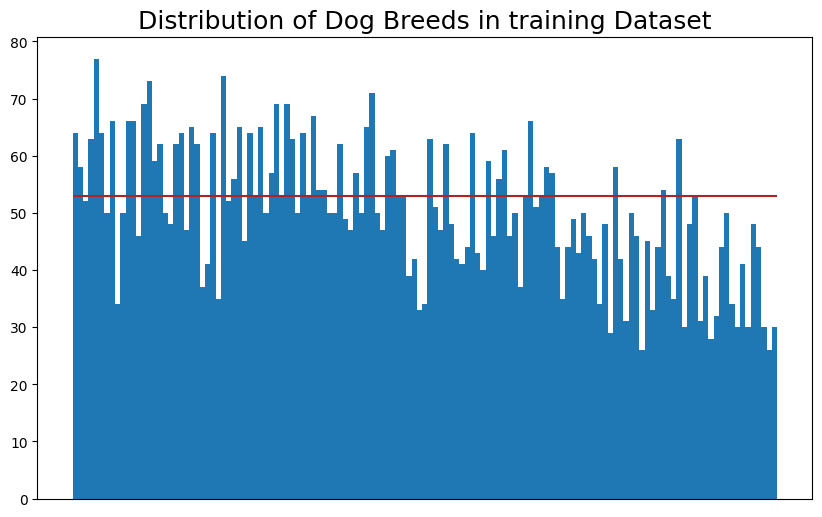

In [9]:
### Determine to distribution of images per dogbreed in the trinaing dataset
dist_breed(labels_train)

In [10]:
### Picking a dog breed from the training labels and determine the indexes
### in the labels list
duplicates(labels_train,'American_water_spaniel')

[8,
 15,
 168,
 275,
 303,
 404,
 405,
 584,
 753,
 1340,
 1389,
 2166,
 2180,
 2449,
 2473,
 2735,
 2927,
 3173,
 3232,
 3796,
 4172,
 4279,
 4404,
 4692,
 4811,
 4827,
 4907,
 5442,
 5527,
 5611,
 6106,
 6252,
 6383,
 6478]

American_water_spaniel
(383, 400, 3)


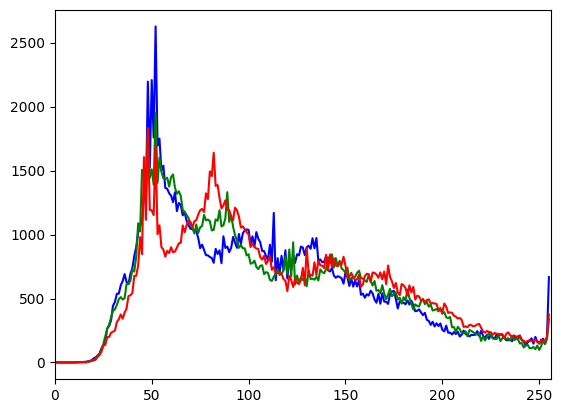

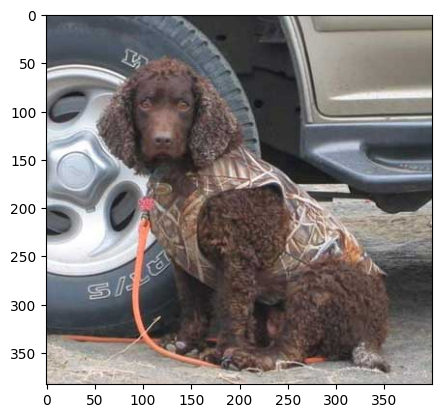

American_water_spaniel
(417, 595, 3)


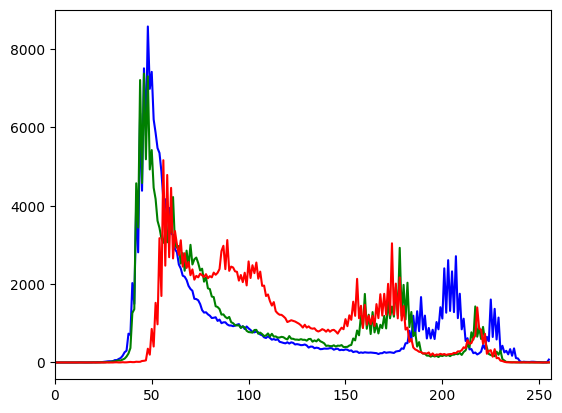

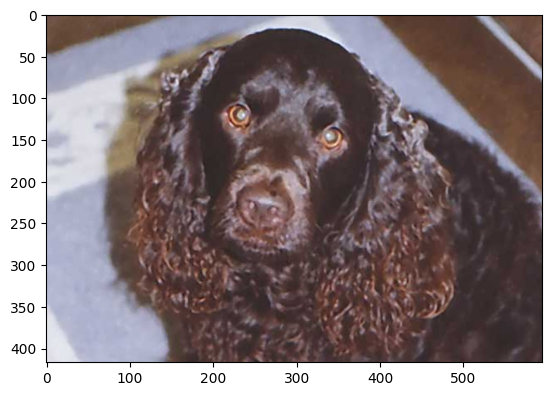

American_water_spaniel
(224, 179, 3)


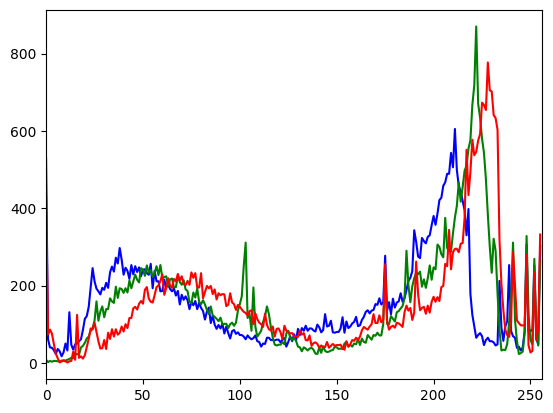

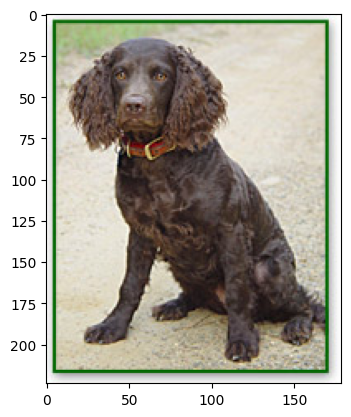

In [11]:
## checking a few images of the same dog breed (indexes listed above) and checking the
##     - the image sizes,
##     - the RGB intensity distribution
## and the result shows images have different resolution, zoom and lightening conditins even for the same breed
## it makes this task even more challenging
image_info(train_files[8], train_targets[8])
image_info(train_files[15], train_targets[15])
image_info(train_files[168], train_targets[168])

##Step 2: Detecting Datasets and Preprocessing

Number of faces detected: 1


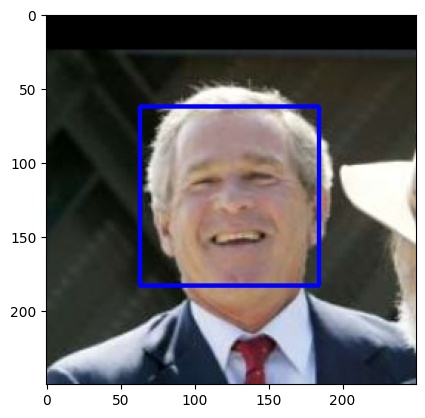

In [12]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# load color (BGR) image
img = cv2.imread(human_files[3])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)

# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Human Face Detector

In [13]:
# returns "True" if face is detected in image stored at img_path

def face_detector(img_path):
    '''
    This function takes an image and detects if the image represents a human face or not

    Input: image file path

    Output: True if image represents a human face
            False if image does not represent a human face
    '''

    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

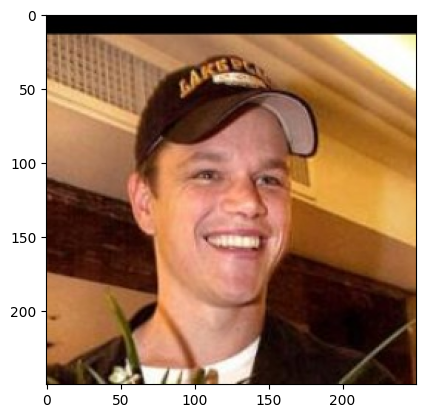

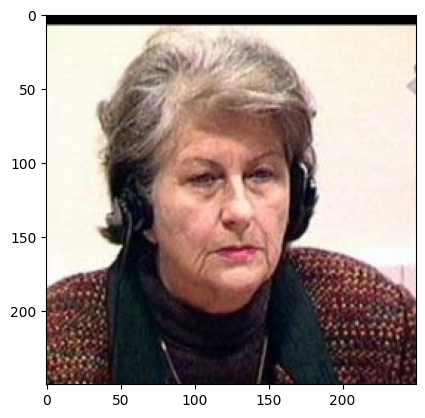

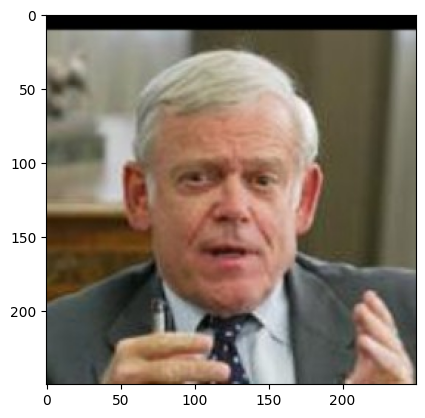

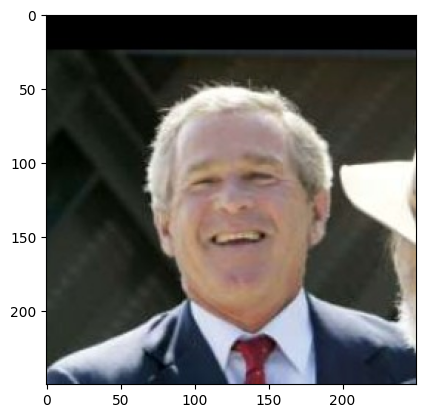

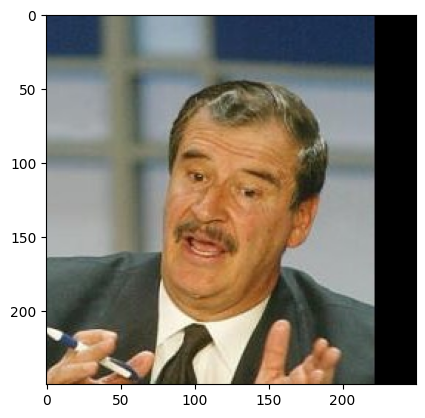

...

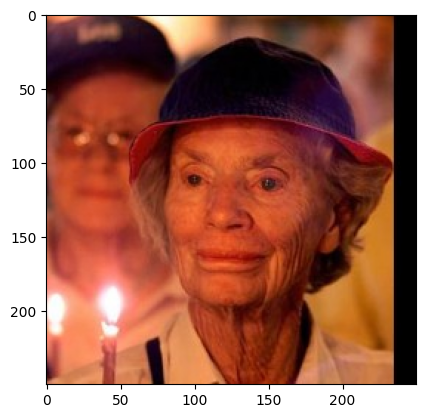

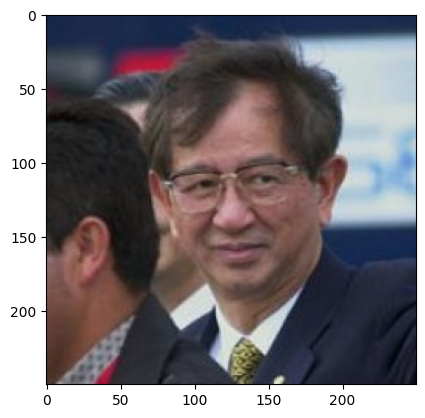

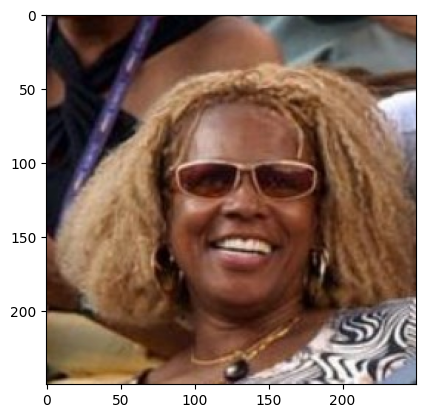

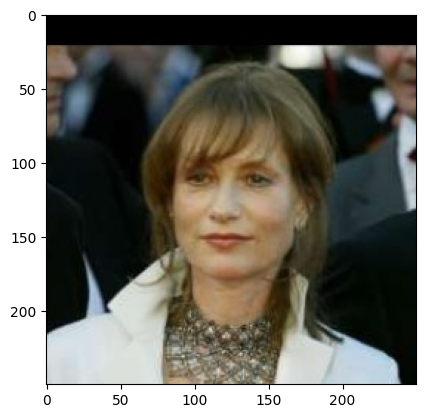

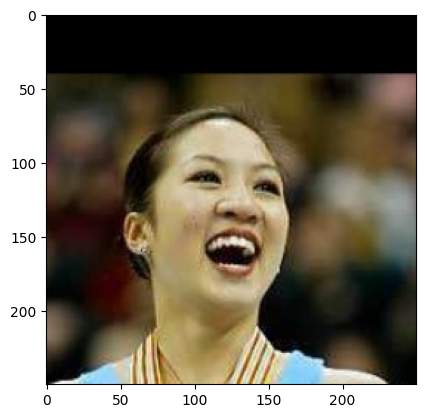

In [ ]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm
## on the images in human_files_short and dog_files_short.
human_face_count = 0
#human_face_count = len([1 for image_path in human_files_short if face_detector(image_path)])
for image_path in human_files_short:
    print_image(image_path)
    if face_detector(image_path):
        human_face_count += 1
human_detection_accuracy = 100. * human_face_count / len(human_files_short)

dog_face_count = 0
for image_path in dog_files_short:
    if face_detector(image_path):
        dog_face_count += 1
        print_image(image_path)

dog_detection_accuracy = 100. * dog_face_count / len(dog_files_short)

print("Humans: {}%\nDogs: {}%".format(human_detection_accuracy, dog_detection_accuracy))

In [ ]:
from keras.applications.resnet import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights='imagenet')

In [ ]:
ResNet50_model.save('ResNet50_model.h5')

In [ ]:
from keras import models
dog_detector_model = models.load_model('ResNet50_model.h5')

Pre-process the Data

In [ ]:
from keras.preprocessing import image
from tqdm import tqdm

def path_to_tensor(img_path):
    '''
    This function preprocesses the image and converts it from a 3 dimensional tensor
    to a 4 dimensional tensor compatible with Keras

    Input: path to an image

    Output: 4D tensor representing image and compatible with Keras
    '''
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

Making Predictions with ResNet-50

In [ ]:
from keras.applications.resnet import preprocess_input, decode_predictions

def ResNet50_predict_labels(img_path):
    '''
    returns prediction vector for image located at img_path

    Input:  image path

    Output: prediction vector
    '''
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

Write a Dog Detector

In [ ]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    '''
    returns "True" if a dog is detected in the image stored at img_path

    Input:  image path

    Output: True if image represents a dog
            False if image does not represent a dog
    '''

    prediction = ResNet50_predict_labels(img_path)

    return ((prediction <= 268) & (prediction >= 151))

In [ ]:
import keras.utils as image
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.
human_face_count = 0
for image_path in human_files_short:
    #print_image(image_path)
    if dog_detector(image_path):
        human_face_count += 1
human_detection_accuracy = 100. * human_face_count / len(human_files_short)

dog_face_count = 0
for image_path in dog_files_short:
    if dog_detector(image_path):
        dog_face_count += 1
        #print_image(image_path)

dog_detection_accuracy = 100. * dog_face_count / len(dog_files_short)

print("Dogs in Humans_Files: {}%\nDogs in Dog_Files: {}%".format(human_detection_accuracy, dog_detection_accuracy))

##Step 3: Create a CNN to Classify Dog Breeds

Pre-process the Data

In [ ]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

Tring different models

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential


###Model 1

In [ ]:
model1 = Sequential()

### TODO: Define your architecture.
# CNN
model1.add(Conv2D(filters=24, kernel_size=2, padding='same', activation='relu',
                        input_shape=(224, 224, 3)))
model1.add(Conv2D(filters=48, kernel_size=2, padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=2))
model1.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
#model1.add(MaxPooling2D(pool_size=2))
model1.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model1.add(MaxPooling2D(pool_size=2))
model1.add(Dropout(0.4))

# MLP frontend
model1.add(Flatten())
model1.add(Dense(500, activation='relu'))
model1.add(Dropout(0.4))
model1.add(Dense(133, activation='softmax'))

model1.summary()

###Model 2

In [ ]:
model2 = Sequential()

### TODO: Define your architecture.
# CNN
model2.add(Conv2D(filters=24, kernel_size=2, padding='same', activation='relu',
                        input_shape=(224, 224, 3)))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model2.add(MaxPooling2D(pool_size=2))
model2.add(Dropout(0.3))

# MLP frontend
model2.add(Flatten())
model2.add(Dense(500, activation='relu'))
model2.add(Dropout(0.4))
model2.add(Dense(133, activation='softmax'))

model2.summary()

###Model 3

In [ ]:
model3 = Sequential()

### TODO: Define your architecture.
# CNN
model3.add(Conv2D(filters=16, kernel_size=2, padding='same', activation='relu',
                        input_shape=(224, 224, 3)))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model3.add(MaxPooling2D(pool_size=2))
model3.add(Dropout(0.3))

# MLP frontend
model3.add(Flatten())
model3.add(Dense(500, activation='relu'))
model3.add(Dropout(0.4))
model3.add(Dense(133, activation='softmax'))

model3.summary()


###Model4

In [ ]:
model4 = Sequential()

### TODO: Define your architecture.
# CNN
model4.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu',
                        input_shape=(224, 224, 3)))
model4.add(MaxPooling2D(pool_size=2))
model4.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
model4.add(MaxPooling2D(pool_size=2))
model4.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model4.add(MaxPooling2D(pool_size=2))
model4.add(Dropout(0.25))

# MLP frontend
model4.add(Flatten())
model4.add(Dense(500, activation='relu'))
model4.add(Dropout(0.4))
model4.add(Dense(133, activation='softmax'))

model4.summary()

###Chosen Model

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()

### TODO: Define your architecture.
# CNN
model.add(Conv2D(filters=16, kernel_size=5, strides=2, padding='same', activation='relu',
                        input_shape=(224, 224, 3)))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64, kernel_size=5, strides=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Conv2D(filters=64, kernel_size=5, strides=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.4))

# MLP frontend
model.add(Flatten())
model.add(Dense(500, activation='relu'))
model.add(Dropout(0.4))
model.add(Dense(133, activation='softmax'))

model.summary()

In [ ]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import ModelCheckpoint

### TODO: specify the number of epochs that you would like to use to train the model.

epochs = 15

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5',
                               verbose=1, save_best_only=True)

model.fit(train_tensors, valid_tensors,
          validation_data=(train_targets, valid_targets),
          epochs=epochs, batch_size=20, callbacks=[checkpointer], verbose=1)

In [ ]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

In [ ]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

###Step 4: Use a CNN to Classify Dog Breeds (using transfer learning)

In [ ]:
import os.path
import numpy as np
bottleneck_features = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']


In [ ]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

In [ ]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5',
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets,
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

In [ ]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

In [ ]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

In [ ]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

###Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

In [ ]:
### TODO: Obtain bottleneck features from another pre-trained CNN.

bottleneck_features = np.load('bottleneck_features/DogXceptionData.npz')
train_Xc = bottleneck_features['train']
valid_Xc = bottleneck_features['valid']
test_Xc = bottleneck_features['test']

In [ ]:
### Define your architecture.

Xception_model = Sequential()
Xception_model.add(GlobalAveragePooling2D(input_shape=train_Xc.shape[1:]))
#my_Xc_model.add(MaxPooling2D(input_shape=train_Xc.shape[1:]))
Xception_model.add(Dense(133, activation='softmax'))

Xception_model.summary()

In [ ]:
### Compile the model.

Xception_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

In [ ]:
### Train the model.

from keras.callbacks import ModelCheckpoint
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.Xc.hdf5',
                               verbose=1, save_best_only=True)

#my_Xc_model.fit(train_Xc, train_targets,
#          validation_data=(valid_Xc, valid_targets),
#          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

Xception_model.fit(train_Xc, train_targets,
           validation_data=(valid_Xc, valid_targets),
           epochs=20, batch_size=20, callbacks=[checkpointer], verbose=1)

In [ ]:
### Load the model weights with the best validation loss.

Xception_model.load_weights('saved_models/weights.best.Xc.hdf5')

In [ ]:
### save the model

Xception_model.save('Xception_model.h5')

In [ ]:
# load model
from keras.models import load_model

dog_breed_model = load_model('Xception_model.h5')

In [ ]:
### Calculate classification accuracy on the test dataset.
# get index of predicted dog breed for each image in test set
my_Xc_predictions = [np.argmax(dog_breed_model.predict(np.expand_dims(feature, axis=0))) for feature in test_Xc]

# report test accuracy
test_accuracy = 100*np.sum(np.array(my_Xc_predictions)==np.argmax(test_targets, axis=1))/len(my_Xc_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

###Dog Breed Classifier

In [ ]:
### Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

from extract_bottleneck_features import *

def my_Xc_predict_breed(img_path):
    """
    This function predicts the dog breed fomr an image

    Input:  image path

    Output:  predicted dog breed
    """
    # extract bottleneck features
    bottleneck_feature = extract_Xception(path_to_tensor(img_path))

    # obtain predicted vector
    #predicted_vector = Xception_model.predict(bottleneck_feature)
    predicted_vector = dog_breed_model.predict(bottleneck_feature)

    # get index with highest probability and predicted dog breed
    predicted_index = np.argmax(predicted_vector)
    predicted_breed = dog_names[predicted_index]

    # replace separators '-' and '_' with spaces and capitalize first letters of breed name
    predicted_breed = predicted_breed.replace('-', ' ').replace('_', ' ').title()

    return predicted_breed

In [ ]:

def image_predictor(img_path):
    """
    Function accepts an image path, attempts to determine if human face
    or a dog is present, and returns the predicted breed or breed
    the human face resembles.

    Input:  path to an image

    Output:  - if dog: image of dog with caption including predicted dog breed
             - if human: image of human with caption including predicted dog breed human looks like
             - if neither dog or human is detected :  image with caption that it is not from this world
    """

    # check for each type and get prediction
    dog = dog_detector(img_path)
    human = face_detector(img_path)
    predicted_breed = my_Xc_predict_breed(img_path)

    img = cv2.imread(img_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb)
    plt.show()

    if dog:
        print("What is this {} looking for?".format(predicted_breed))
    elif human:
        print("You might resemble your pet {}.".format(predicted_breed))
    else:
        print("You definitely do not come from this world.")
    return

In [ ]:
ls images/

In [ ]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

image_list= glob("images/*.jpg")
image_list

#for image in image_list:
#image_predictor(image)

In [ ]:
for i in image_list:
    image_predictor(i)